<a href="https://colab.research.google.com/github/Piaiai/My-pets/blob/master/ORO_lab_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
!unzip -uq "/content/ОРО_Лб_3_jpg"

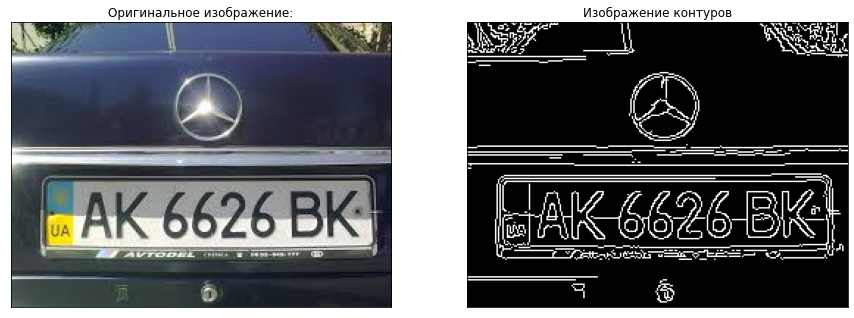

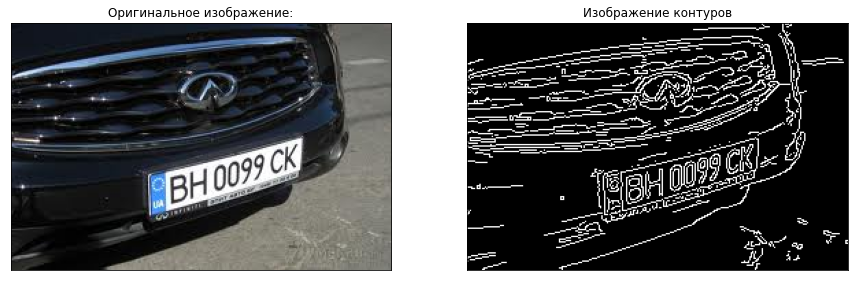

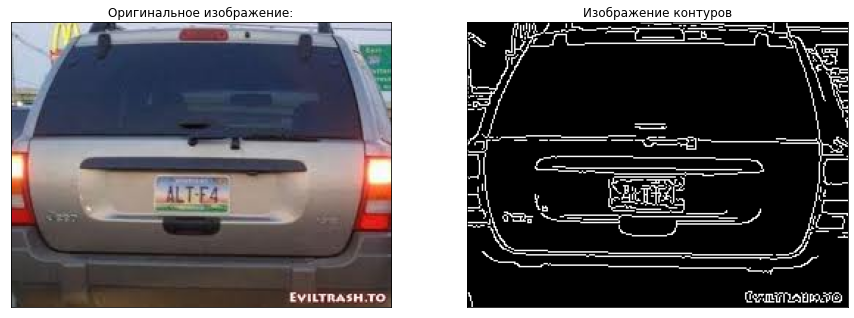

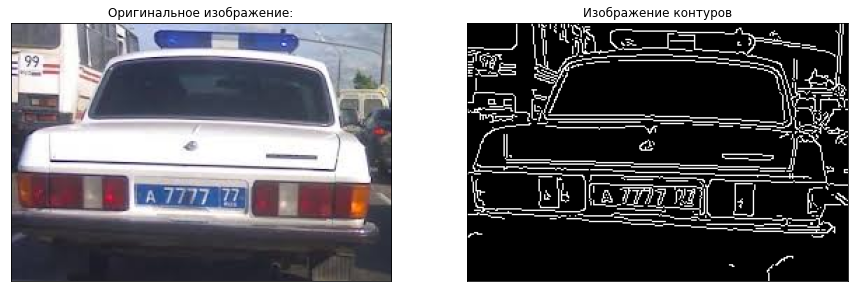

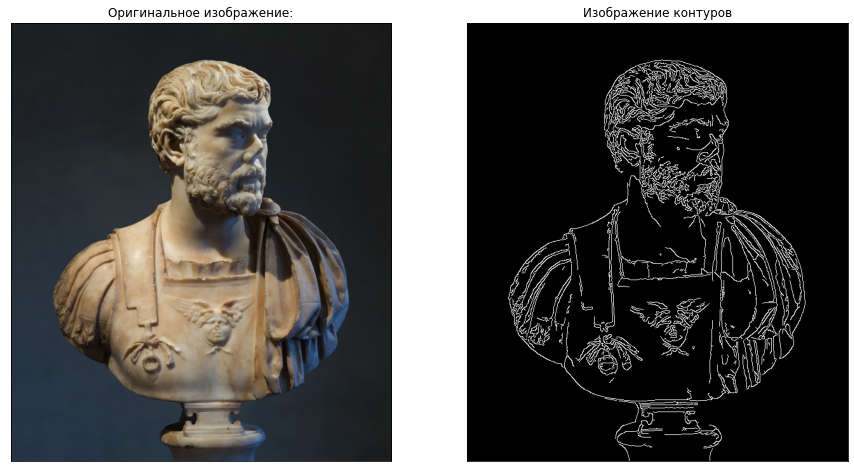

...

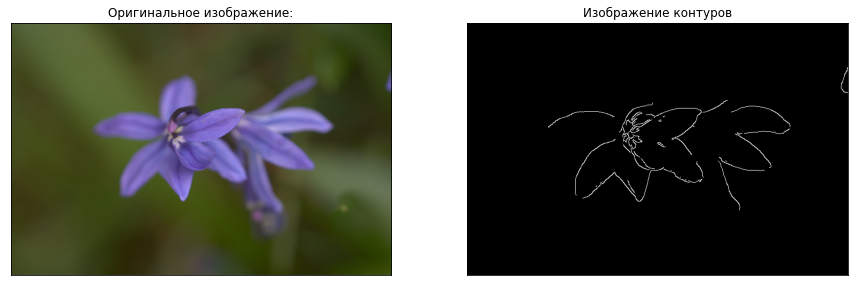

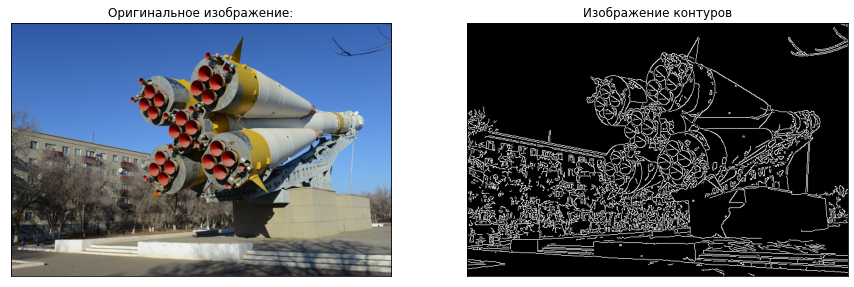

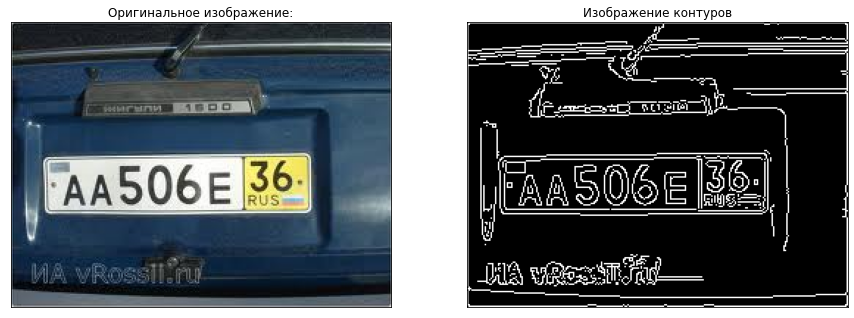

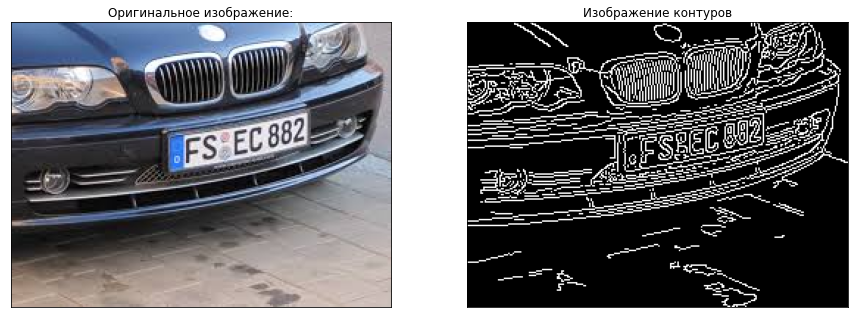

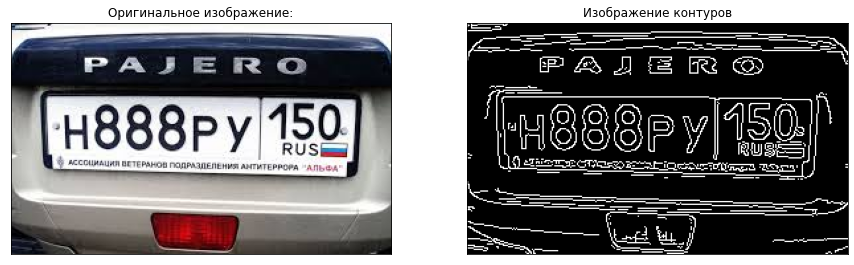

In [ ]:
import os
img_path = "/content/ОРО_Лб_3_jpg"
images = os.listdir(img_path)


for i, image in enumerate(images):
    img = cv2.imread(img_path + '/' + image, 1)
    edges = cv2.Canny(img,100,200)
    plt.figure(figsize=(15,10))
    plt.subplot(121),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Оригинальное изображение:'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Изображение контуров'), plt.xticks([]), plt.yticks([])
    plt.show()

In [ ]:
img.shape, img.dtype

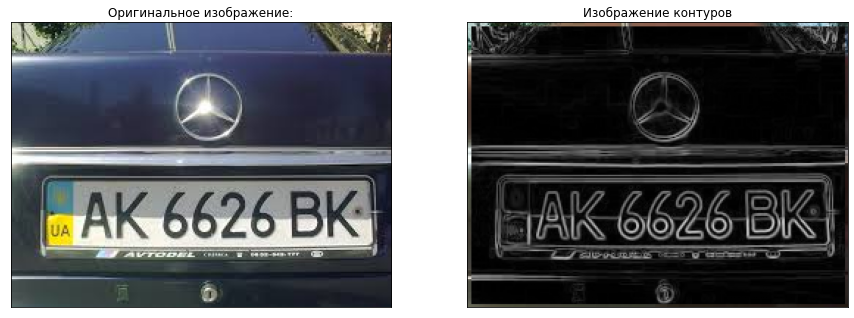

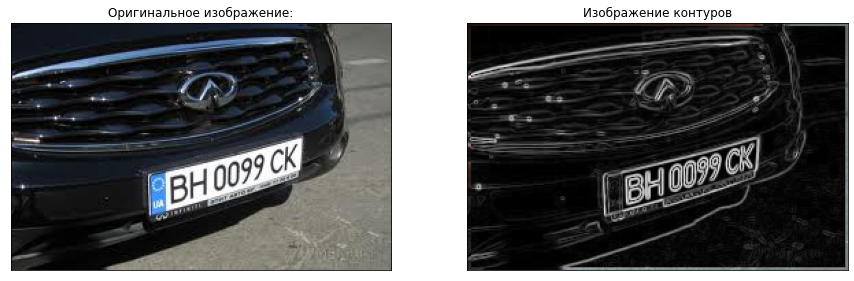

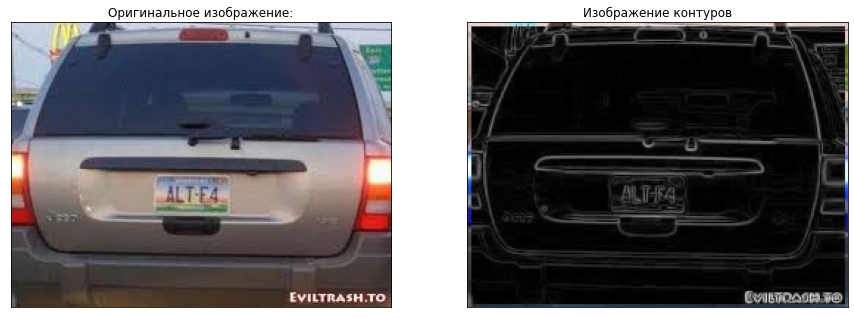

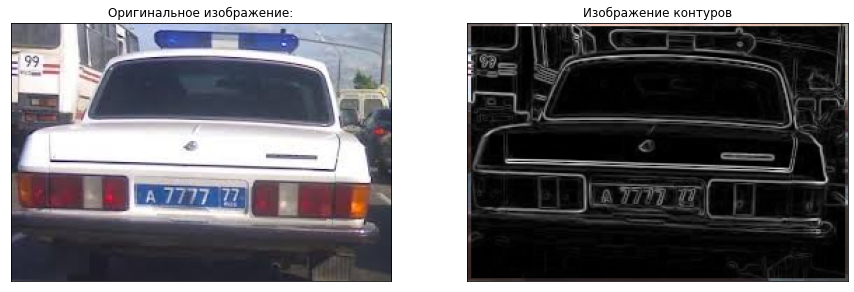

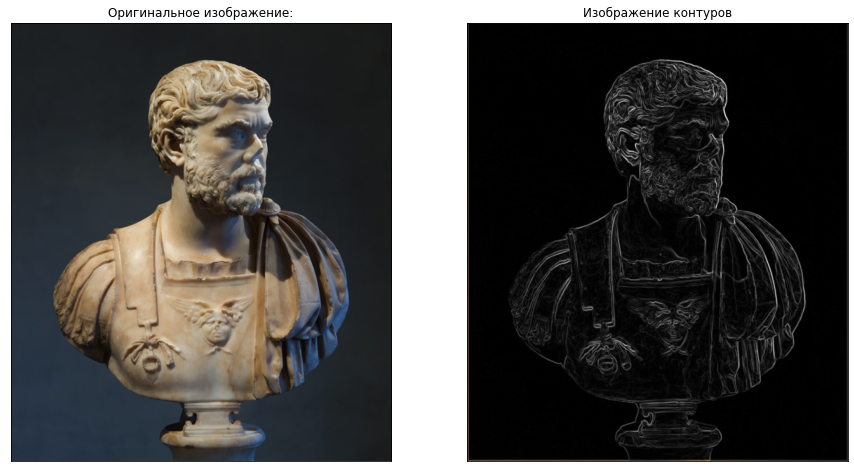

...

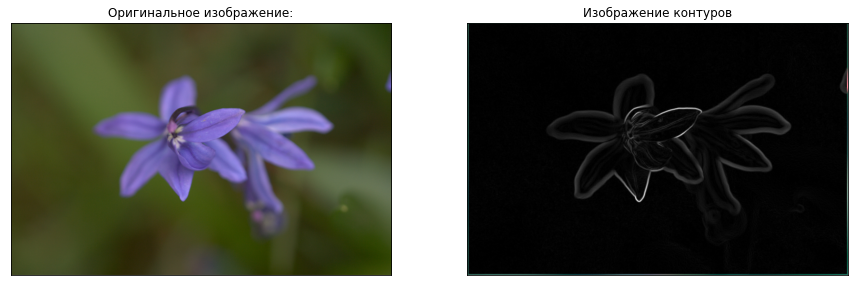

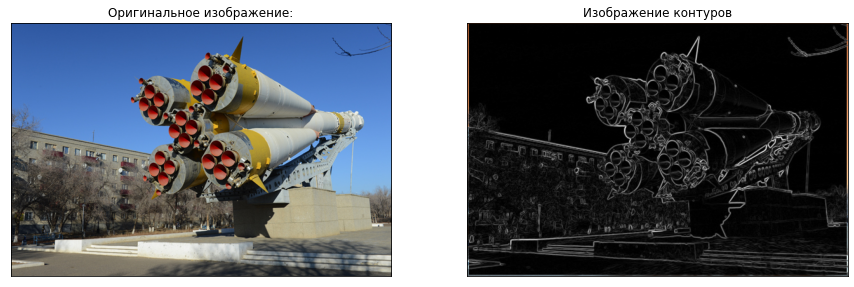

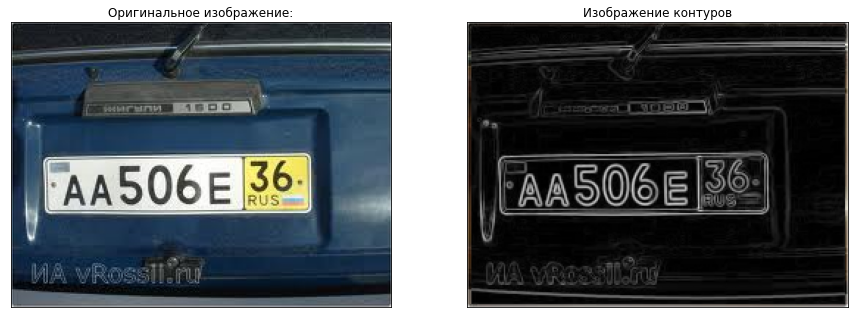

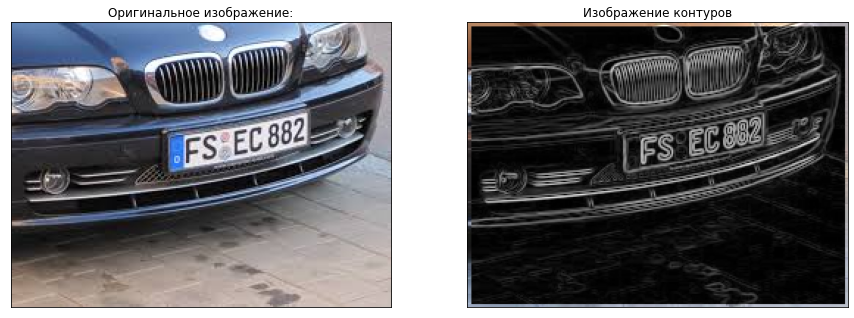

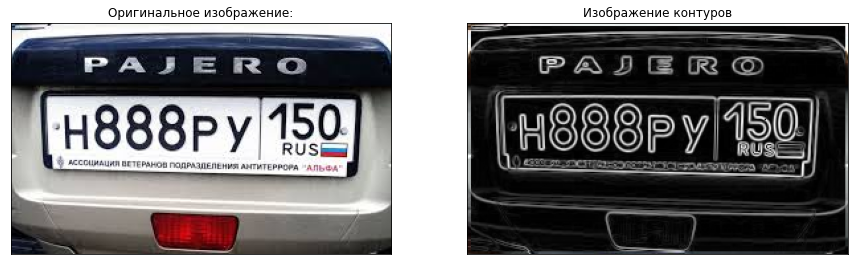

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def toEdges(img):
    vertical_filter = [[-1,-2,-1], [0,0,0], [1,2,1]]
    horizontal_filter = [[-1,0,1], [-2,0,2], [-1,0,1]]
    n,m,d = img.shape
    edges_img = img.copy()
    for row in range(3, n-2):
        for col in range(3, m-2):
            local_pixels = img[row-1:row+2, col-1:col+2, 0]
            vertical_transformed_pixels = vertical_filter*local_pixels
            vertical_score = vertical_transformed_pixels.sum()/4
            horizontal_transformed_pixels = horizontal_filter*local_pixels
            horizontal_score = horizontal_transformed_pixels.sum()/4
            edge_score = (vertical_score**2 + horizontal_score**2)**.5
            edges_img[row, col] = [edge_score]*3

    return edges_img/edges_img.max()


for i, image in enumerate(images):
    img = cv2.imread(img_path + '/' + image, 1)
    edges = toEdges(img)#,100,200)
    plt.figure(figsize=(15,10))
    plt.subplot(121),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Оригинальное изображение:'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Изображение контуров'), plt.xticks([]), plt.yticks([])
    plt.show()